<a href="https://colab.research.google.com/github/callen350/haadf-stem-hackathon/blob/master/notebooks/AtomicSemanticSegmention.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Semantic segmentation-based analysis of atomic images

Author: Maxim Ziatdinov

Email: ziatdinovmax@gmail.com



---


This notebook shows i) how to apply a UNet-like neural network for semantic segmentation of atomic images and to perform; ii) how to apply multivariate statistical analysis to the semantically-segmented output.


---



Install AtomAI:

In [1]:
!pip -q install git+https://github.com/pycroscopy/atomai # install the latest version from source
!pip -q install hyperspy gdown

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.1/193.1 kB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 280.6/280.6 kB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.3/176.3 kB 20.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.0/56.0 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 50.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.1/48.1 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.7/47.7 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 20.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 306.8/306.8 kB 33.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 98.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 53.2 MB/s eta 0:00:00


Imports:

In [2]:
import atomai as aoi
import numpy as np
import matplotlib.pyplot as plt
import hyperspy.api as hs
from google.colab import drive
import gdown



In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
### Load Necessary Libraries
from skimage.feature import peak_local_max as MaxPeak
import numpy as np
import matplotlib.pyplot as plt
import hyperspy.api as hs
from scipy import ndimage
from matplotlib.legend_handler import HandlerPatch
import matplotlib.patches as mpatches
from matplotlib.patches import Circle
from matplotlib.patches import Rectangle
from scipy.optimize import curve_fit
from pylab import cm
import time
import copy
%matplotlib inline

In [6]:
class HandlerEllipse(HandlerPatch):
    def create_artists(self, legend, orig_handle,
                       xdescent, ydescent, width, height, fontsize, trans):
        center = 0.5 * width - 0.5 * xdescent, 0.5 * height - 0.5 * ydescent
        p = mpatches.Ellipse(xy=center, width=width + xdescent,
                             height=height + ydescent)
        self.update_prop(p, orig_handle, legend)
        p.set_transform(trans)
        return [p]
def gauss(x,a,x0,sigma):
    return a*np.exp(-(x-x0)**2/sigma**2)
def bigauss(x,a1,a2,x01,x02,s1,s2):
    a=a1*np.exp(-(x-x01)**2/s1**2)
    b=a2*np.exp(-(x-x02)**2/s2**2)
    return a+b
def trigauss(x,a1,a2,a3,x01,x02,x03,s1,s2,s3):
    a=a1*np.exp(-(x-x01)**2/s1**2)
    b=a2*np.exp(-(x-x02)**2/s2**2)
    c=a3*np.exp(-(x-x03)**2/s3**2)
    return a+b+c
def tetragauss(x,a1,a2,a3,a4,x01,x02,x03,x04,s1,s2,s3,s4):
    a=a1*np.exp(-(x-x01)**2/s1**2)
    b=a2*np.exp(-(x-x02)**2/s2**2)
    c=a3*np.exp(-(x-x03)**2/s3**2)
    d=a4*np.exp(-(x-x04)**2/s4**2)
    return a+b+c+d
def pentagauss(x,a1,a2,a3,a4,a5,x01,x02,x03,x04,x05,s1,s2,s3,s4,s5):
    a=a1*np.exp(-(x-x01)**2/s1**2)
    b=a2*np.exp(-(x-x02)**2/s2**2)
    c=a3*np.exp(-(x-x03)**2/s3**2)
    d=a4*np.exp(-(x-x04)**2/s4**2)
    e=a5*np.exp(-(x-x05)**2/s5**2)
    return a+b+c+d+e

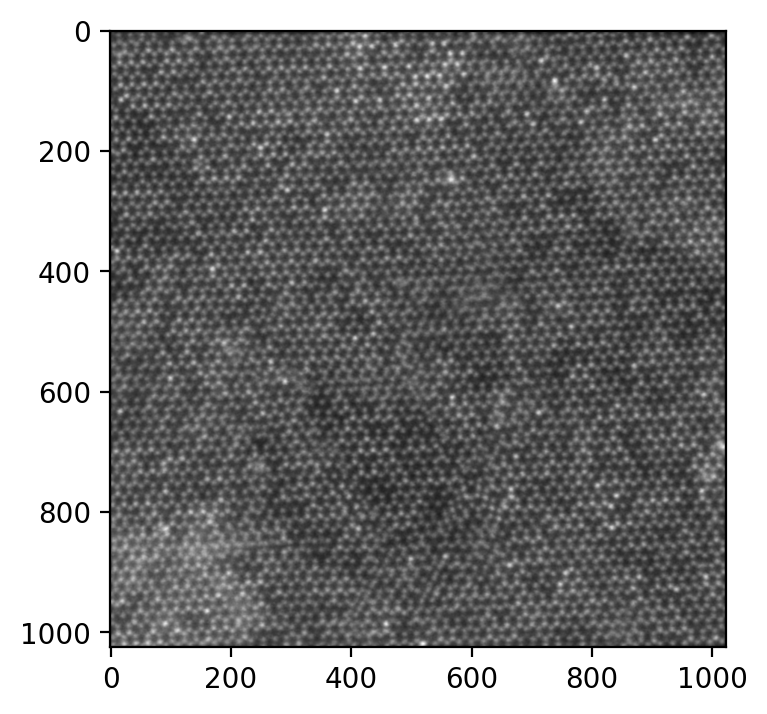

In [7]:
### Load Image Stack, Integrate, Add Gaussian Smoothing
StackIn = hs.load('/content/drive/MyDrive/hackathon/QuaternaryAlloyMoWSSe/aligned/3D Stack align2.dm3')
cal=StackIn.axes_manager[2].scale
Im=np.sum(StackIn.data,axis=0)

### Optional Gaussian Bluring
Im = ndimage.gaussian_filter(Im, 1.0)

### Normalize Image
nIm= (Im-np.amin(Im))/np.ptp(Im)
fig=plt.figure(dpi=200, figsize=(4,4))
plt.imshow(nIm, cmap='gray')
plt.show()

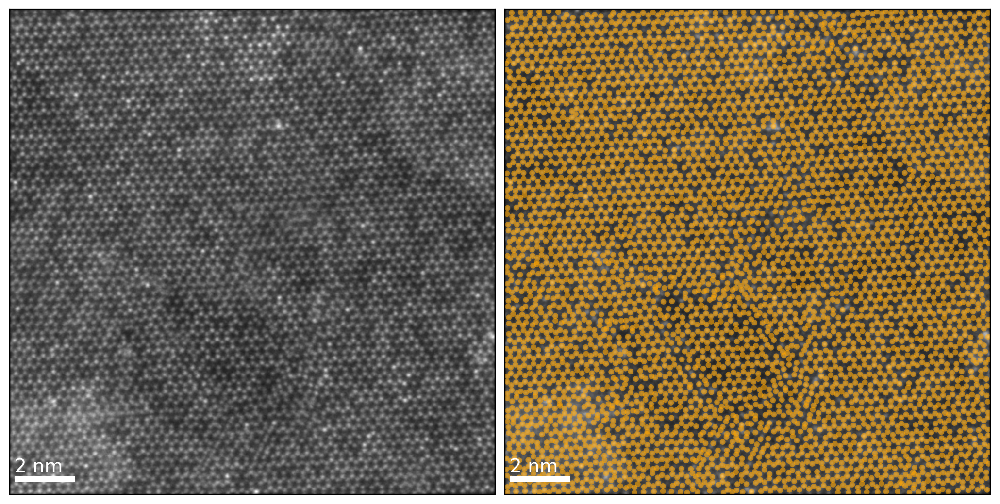

In [8]:
### Find all atoms in image
r=3
allatoms=MaxPeak(nIm,r, threshold_rel=0.1,exclude_border=True)
fig=plt.figure(figsize=(10.2,5),dpi=200)
ax=fig.add_axes([0,0,0.5,1],xticks=[],yticks=[])
ax.imshow(nIm, cmap='gray')
ax.add_patch(Rectangle((10,985),2/cal,0.2/cal,fc="white"))
ax.text(10,985,'2 nm',ha='left',va='bottom',fontsize=14,color='white')
ax=fig.add_axes([0.5,0,0.5,1],xticks=[],yticks=[])
ax.imshow(nIm, cmap='gray')
for atom in allatoms: ax.add_patch(Circle(atom[::-1], radius=2*r, alpha =.6 ,fc='Orange',lw=0.25))
ax.add_patch(Rectangle((10,985),2/cal,0.2/cal,fc="white"))
ax.text(10,985,'2 nm',ha='left',va='bottom',fontsize=14,color='white')
plt.show()

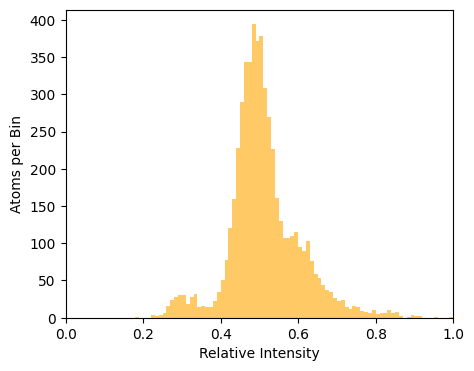

In [9]:
### Plot Histogram of Intensities
aint=[nIm[a[0]][a[1]] for a in allatoms]
fig=plt.figure(figsize=(5,4))
a=plt.hist(aint,100,range=(0,1),alpha=0.6,lw=0.5,color='Orange',histtype='stepfilled')
plt.xlabel('Relative Intensity')
plt.ylabel('Atoms per Bin')
plt.xlim(0,1)

plt.show()

### Note: Insufficient information to distinguish between all four species

In [10]:
### Sort into A Sites and B Sites (Note: A better programmer could probably improve this dramatically)

natoms=len(allatoms)
T=0.25
def dist(a,b):
    return np.sqrt(np.sum((a[0]-b[0])**2+(a[1]-b[1])**2))
d=[];idx=[]
start=time.time()

### Step 1: Find Nearest Neighbors for all atoms
for i in range(natoms):
    if i == natoms//100:
        print("1% in "+str(round(time.time()-start,2))+" seconds. Estimated Finish Time: "+str(round((time.time()-start)*100/60.,2))+" minutes")
    if i == (10*natoms)//100:
        print("10% Finished")
    if i == (20*natoms)//100:
        print("20% Finished")
    if i == (30*natoms)//100:
        print("30% Finished")
    if i == (40*natoms)//100:
        print("40% Finished")
    if i == (50*natoms)//100:
        print("50% Finished")
    if i == (60*natoms)//100:
        print("60% Finished")
    if i == (70*natoms)//100:
        print("70% Finished")
    if i == (80*natoms)//100:
        print("80% Finished")
    if i == (90*natoms)//100:
        print("90% Finished")
    d.append([])
    idx.append([])
    for j in range(natoms):
        if i!=j and dist(allatoms[i],allatoms[j])*cal < T:
            d[i].append([(allatoms[i][1]-allatoms[j][1])*cal,(allatoms[i][0]-allatoms[j][0])*cal])
            idx[i].append(j)
ASite=[];BSite=[];BSitefromA=[];ASitefromB=[];Others=[]
step1=time.time()
print("Step 1 Time = " + str(step1-start) + " seconds")

### Step 2: Identify each atom as A-Site or B-Site depending on Coordination of Nearest Neighbors
###         (2 Above, 1 Below - A-Site, 2 Below, 1 Above - B-Site)
for i in range(natoms):
    if len(d[i])==3:
        pm=0
        for xyd in d[i]:
            if xyd[1]>0:pm+=1
            else: pm-=1
        if pm>0:
            ASite.append(i)
            BSitefromA.append(idx[i])
        else:
            BSite.append(i)
            ASitefromB.append(idx[i])
step2=time.time()
print("Step 2 Time = " + str(step2-step1) + " seconds")

### Step 3-7: If atom does not have 3 identified nearest neighbors, determine A/B identity by examinging labeled
###           nearest neighbors (if atom has all A-Site neighbors, identify as B-Site and vice versa). Loop
###           iteratively until all atoms identified. Throw away conflicts.
for a in ASite:
    if a in BSite:
        print("First Step")
        break
BfromA=[i for nn in BSitefromA for i in nn]
AfromB=[i for nn in ASitefromB for i in nn]
step3=time.time()
print("Step 3 Time = " + str(step3-step2) + " seconds")
for a in AfromB:
    if a not in ASite and a not in BSite: ASite.append(a)
for b in BfromA:
    if b not in BSite and b not in ASite: BSite.append(b)
for i in range(natoms):
    if i not in ASite and i not in BSite: Others.append(i)
for a in ASite:
    if a in BSite:
        print("Second Step")
        break
step4=time.time()
print("Step 4 Time = " + str(step4-step3) + " seconds")
print(natoms, len(ASite)+len(BSite)+len(Others), len(ASite), len(BSite), len(Others))
Changed=True
while Changed:
    print('Others Loop')
    NextO=[];Changed=False
    for o in Others:
        first=True;ProbA=False;ProbB=False
        for i in idx[o]:
            if first:
                first=False
                if i in ASite: ProbB=True
                if i in BSite: ProbA=True
            else:
                if i in ASite:
                    ProbB=True
                    if ProbA: ProbA=False;ProbB=False
                if i in BSite:
                    ProbA=True
                    if ProbB: ProbA=False;ProbB=False
        if ProbA and o not in ASite: ASite.append(o);Changed=True
        if ProbB and o not in BSite: BSite.append(o);Changed=True
        if not ProbA and not ProbB: NextO.append(o)
    Others=NextO
step5=time.time()
print("Step 5 Time = " + str(step5-step4) + " seconds")
print(len(allatoms), len(ASite)+len(BSite)+len(Others), len(ASite), len(BSite), len(Others))
oidx=[[] for i in range(natoms)]
for o in Others:
    for i in range(natoms):
        oidx.append([])
        od=dist(allatoms[o],allatoms[i])*cal
        if o!=i and od < T*2: oidx[o].append((od,i))
oidx=[sorted(o) for o in oidx]
step6=time.time()
print("Step 6 Time = " + str(step6-step5) + " seconds")
AfromO2=[];BfromO2=[]
for o in enumerate(oidx):
    ino=0;ina=0;inb=0
    for oid in o[1]:
        if oid[1] in Others: ino+=1
        if oid[1] in ASite: ina+=1
        if oid[1] in BSite: inb+=1
        if ina+inb-ino<-1: break
        if ina>1: AfromO2.append(o[0]); break
        if inb>1: BfromO2.append(o[0]); break
for a in AfromO2:
    if a not in ASite: ASite.append(a)
for b in BfromO2:
    if b not in BSite: BSite.append(b)
step7=time.time()
print("Step 7 Time = " + str(step7-step6) + " seconds")
print(len(allatoms), len(ASite)+len(BSite)+len(Others), len(ASite), len(BSite), len(Others))
Changed=True
while Changed:
    print('Others Loop')
    NextO=[];Changed=False
    for o in Others:
        if o in ASite: break
        if o in BSite: break
        first=True;ProbA=False;ProbB=False
        for i in idx[o]:
            if first:
                first=False
                if i in ASite: ProbB=True
                if i in BSite: ProbA=True
            else:
                if i in ASite:
                    ProbB=True
                    if ProbA: ProbA=False;ProbB=False
                if i in BSite:
                    ProbA=True
                    if ProbB: ProbA=False;ProbB=False
        if ProbA and o not in ASite: ASite.append(o);Changed=True
        if ProbB and o not in BSite: BSite.append(o);Changed=True
        if not ProbA and not ProbB: NextO.append(o)
    Others=NextO
step8=time.time()
print("Step 8 Time = " + str(step8-step7) + " seconds")
print(len(allatoms), len(ASite)+len(BSite)+len(Others), len(ASite), len(BSite), len(Others))

1% in 2.44 seconds. Estimated Finish Time: 4.07 minutes
10% Finished
20% Finished
30% Finished
40% Finished
50% Finished
60% Finished
70% Finished
80% Finished
90% Finished
Step 1 Time = 272.7595360279083 seconds
Step 2 Time = 0.0042684078216552734 seconds
Step 3 Time = 0.04235672950744629 seconds
Step 4 Time = 0.3980579376220703 seconds
5442 5442 2841 2467 134
Others Loop
Others Loop
Others Loop
Step 5 Time = 0.020215511322021484 seconds
5442 5442 2882 2509 51
Step 6 Time = 4.4337873458862305 seconds
Step 7 Time = 0.05417656898498535 seconds
5442 5490 2926 2513 51
Others Loop
Step 8 Time = 0.00048351287841796875 seconds
5442 5439 2926 2513 0


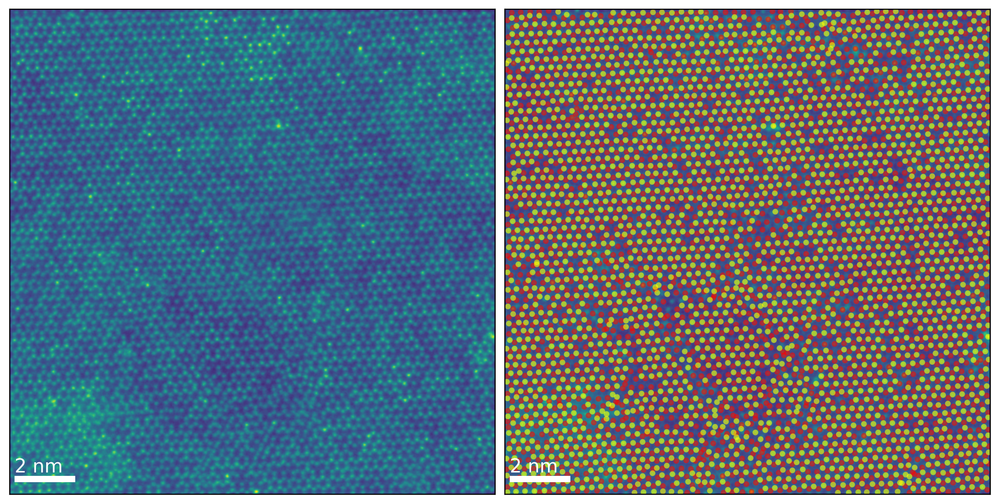

In [11]:
### Show Result of AB Sorting
fig=plt.figure(figsize=(10.2,5),dpi=200)
ax=fig.add_axes([0,0,0.5,1],xticks=[],yticks=[])
ax.imshow(nIm)
ax.add_patch(Rectangle((10,985),2/cal,0.2/cal,fc="white"))
ax.text(10,985,'2 nm',ha='left',va='bottom',fontsize=14,color='white')
ax=fig.add_axes([0.5,0,0.5,1],xticks=[],yticks=[])
ax.imshow(nIm)
for a in ASite: ax.add_patch(Circle((allatoms[a][1],allatoms[a][0]),alpha=0.6, radius=2*r,fc='r',lw=0.25))
for b in BSite: ax.add_patch(Circle((allatoms[b][1],allatoms[b][0]),alpha=0.6, radius=2*r,fc='Yellow',lw=0.25))
ax.add_patch(Rectangle((10,985),2/cal,0.2/cal,fc="white"))
ax.text(10,985,'2 nm',ha='left',va='bottom',fontsize=14,color='white')

plt.show()

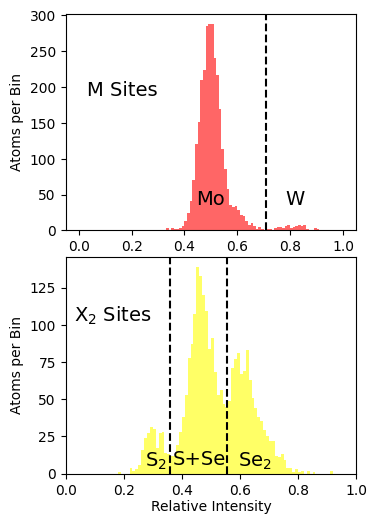

In [12]:
### Plot histogram of intensities and determine thresholds between atomic species

### Set A Site Thresholds as List
at=[0.71]

### Set B Site Thresholds as List
bt=[0.36,0.555]

Aatoms=[allatoms[a] for a in ASite]
Batoms=[allatoms[b] for b in BSite]
Aint=[nIm[a[0],a[1]] for a in Aatoms]
Bint=[nIm[b[0],b[1]] for b in Batoms]
fig=plt.figure(figsize=(3.5,5))
ax=fig.add_subplot(211)
a=ax.hist(Aint,100,range=(0,1),alpha=0.6,lw=0.5,color='r',histtype='stepfilled')
ax.text(0.03,209,'M Sites',fontsize=14,va='top')
ax.text(0.5,30,'Mo',fontsize=14,va='bottom',ha='center')
ax.text(0.82,30,'W',fontsize=14,va='bottom',ha='center')
for t in at: ax.axvline(t,ls='--',color='k')
ax.set_ylabel('Atoms per Bin')
ax=fig.add_subplot(212)
b=ax.hist(Bint,100,range=(0,1),alpha=0.6,lw=0.5,color='Yellow',histtype='stepfilled')
for t in bt: ax.axvline(t,ls='--',color='k')
ax.text(0.03,114,r'$\mathregular{X_2}$ Sites',fontsize=14,va='top')
ax.text(0.31,1,r'$\mathregular{S_2}$',fontsize=14,va='bottom',ha='center')
ax.text(0.46,3,'S+Se',fontsize=14,va='bottom',ha='center')
ax.text(0.65,1,r'$\mathregular{Se_2}$',fontsize=14,va='bottom',ha='center')
plt.xlabel('Relative Intensity',labelpad=2)
ax.set_ylabel('Atoms per Bin')
plt.xlim(0,1)
plt.subplots_adjust(bottom=0.08,top=1,right=0.97,left=0.14,hspace=0.12)
at.append(1.0);bt.append(1.0)

In [13]:
### Use thresholds to sort atoms into individual atomic species

Asort=[[] for i in range(len(at))]
AsortI=[[] for i in range(len(at))]
Asortidx=[[] for i in range(len(at))]
for a in enumerate(Aint):
    asorted=False
    for t in enumerate(at):
        if a[1] < t[1]:
            Asort[t[0]].append(Aatoms[a[0]])
            AsortI[t[0]].append(Aint[a[0]])
            Asortidx[t[0]].append(int(np.where((allatoms==Aatoms[a[0]]).all(axis=1))[0]))
            asorted=True
            break
Bsort=[[] for i in range(len(bt))]
BsortI=[[] for i in range(len(bt))]
Bsortidx=[[] for i in range(len(bt))]
for b in enumerate(Bint):
    bsorted=False
    for t in enumerate(bt):
        if b[1] < t[1]:
            Bsort[t[0]].append(Batoms[b[0]])
            BsortI[t[0]].append(Bint[b[0]])
            Bsortidx[t[0]].append(int(np.where((allatoms==Batoms[b[0]]).all(axis=1))[0]))
            bsorted=True
            break
Isort=BsortI+AsortI
IdxSort=Asortidx+Bsortidx
AtomSort=Asort+Bsort

/tmp/ipython-input-3701157323.py:12: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  Asortidx[t[0]].append(int(np.where((allatoms==Aatoms[a[0]]).all(axis=1))[0]))
/tmp/ipython-input-3701157323.py:24: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  Bsortidx[t[0]].append(int(np.where((allatoms==Batoms[b[0]]).all(axis=1))[0]))


/tmp/ipython-input-3725205485.py:5: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(Isort,100,(0,1.),lw=0.5,histtype='stepfilled',color=colors,alpha=0.6)


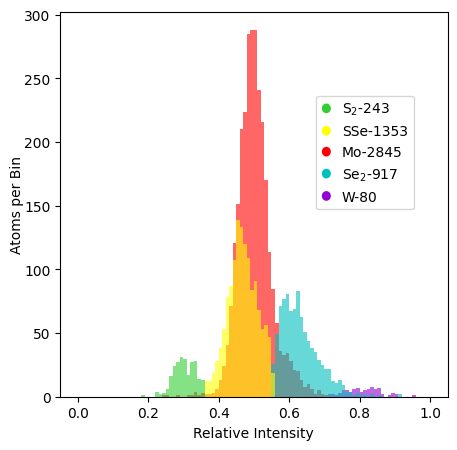

In [14]:
### Plot sorted histogram

colors=['LimeGreen','Yellow','c','r','DarkViolet']
fig=plt.figure(figsize=(5,5))
plt.hist(Isort,100,(0,1.),lw=0.5,histtype='stepfilled',color=colors,alpha=0.6)
S2=Circle((-10,-10),radius=5,fc='LimeGreen',lw=0.25,label=r'$\mathregular{S_2}$-'+str(len(Bsort[0])))
SSe=Circle((-10,-10),radius=5,fc='Yellow',lw=0.25,label='SSe-'+str(len(Bsort[1])))
Mo=Circle((-10,-10),radius=5,fc='r',lw=0.25,label='Mo-'+str(len(Asort[0])))
Se2=Circle((-10,-10),radius=5,fc='c',lw=0.25,label=r'$\mathregular{Se_2}$-'+str(len(Bsort[2])))
W=Circle((-10,-10),radius=5,fc='DarkViolet',lw=0.25,label='W-'+str(len(Asort[1])))

plt.legend(handles=[S2,SSe,Mo,Se2,W],handlelength=0.65,handler_map={Circle:HandlerEllipse()},bbox_to_anchor=(0.93, 0.8))
plt.xlabel("Relative Intensity")
plt.ylabel("Atoms per Bin",labelpad=0)

plt.show()

/tmp/ipython-input-1678601684.py:14: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ka[kma.labels_[a[0]]].append(float(Az[a[0]]))
/tmp/ipython-input-1678601684.py:17: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  kb[kmb.labels_[b[0]]].append(float(Bz[b[0]]))
/tmp/ipython-input-1678601684.py:31: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(kIsort,100,(0,1.),lw=0.5,histtype='stepfilled',color=colors,alpha=0.6)


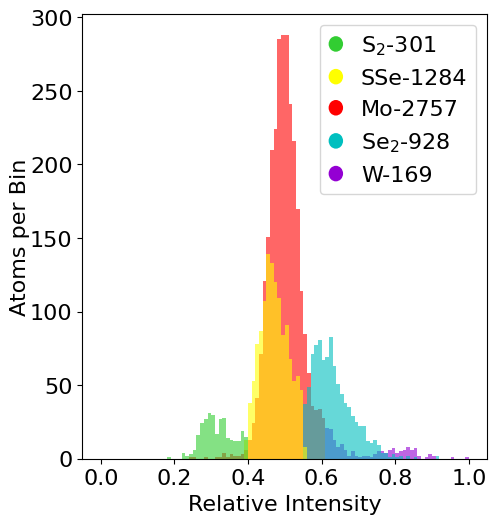

In [15]:
### Optional: As opposed to setting limits based on dips in histogram use k-means clustering for objective labelling

from sklearn.cluster import KMeans
Az = np.float32(Aint).reshape(len(Aint),1)
Bz = np.float32(Bint).reshape(len(Bint),1)
na,nb=2,3
kma = KMeans(n_clusters=2, random_state=0).fit(Az)
kmb = KMeans(n_clusters=3, random_state=0).fit(Bz)
ka=[[] for n in range(na)]
kia=[[] for n in range(na)]
kb=[[] for n in range(nb)]
kib=[[] for n in range(nb)]
for a in enumerate(Aatoms):
    ka[kma.labels_[a[0]]].append(float(Az[a[0]]))
    kia[kma.labels_[a[0]]].append(a[1])
for b in enumerate(Batoms):
    kb[kmb.labels_[b[0]]].append(float(Bz[b[0]]))
    kib[kmb.labels_[b[0]]].append(b[1])
kAatoms=list(zip(ka,kia));kAatoms.sort(key=lambda x: np.average(x[0]))
kBatoms=list(zip(kb,kib));kBatoms.sort(key=lambda x: np.average(x[0]))
kAsortI=[species[0] for species in kAatoms]
kBsortI=[species[0] for species in kBatoms]
kAsort=[species[1] for species in kAatoms]
kBsort=[species[1] for species in kBatoms]
kIsort=kBsortI+kAsortI

colors=['LimeGreen','Yellow','c','r','DarkViolet']
fig=plt.figure(figsize=(5,5))
#ax=fig.add_axes([0,0,1,1])
ax=fig.add_subplot(111)
plt.hist(kIsort,100,(0,1.),lw=0.5,histtype='stepfilled',color=colors,alpha=0.6)
#plt.hist(kb+ka,100,(0,1.),lw=0.5,histtype='stepfilled',color=colors,alpha=0.6)
S2=Circle((-10,-10),radius=5,fc='LimeGreen',lw=0.25,label=r'$\mathregular{S_2}$-'+str(len(kBsort[0])))
SSe=Circle((-10,-10),radius=5,fc='Yellow',lw=0.25,label='SSe-'+str(len(kBsort[1])))
Mo=Circle((-10,-10),radius=5,fc='r',lw=0.25,label='Mo-'+str(len(kAsort[0])))
Se2=Circle((-10,-10),radius=5,fc='c',lw=0.25,label=r'$\mathregular{Se_2}$-'+str(len(kBsort[2])))
W=Circle((-10,-10),radius=5,fc='DarkViolet',lw=0.25,label='W-'+str(len(kAsort[1])))

plt.legend(handles=[S2,SSe,Mo,Se2,W],handlelength=0.65,handler_map={Circle:HandlerEllipse()},bbox_to_anchor=(1, 1),fontsize=16)
plt.xlabel("Relative Intensity",fontsize=16)
plt.ylabel("Atoms per Bin",labelpad=0,fontsize=16)
ax.tick_params(labelsize=16)
plt.subplots_adjust(left=0.15,right=0.96,top=1)

### Note: k-means clustering picks up tail of Mo peak as W atoms.

plt.show()

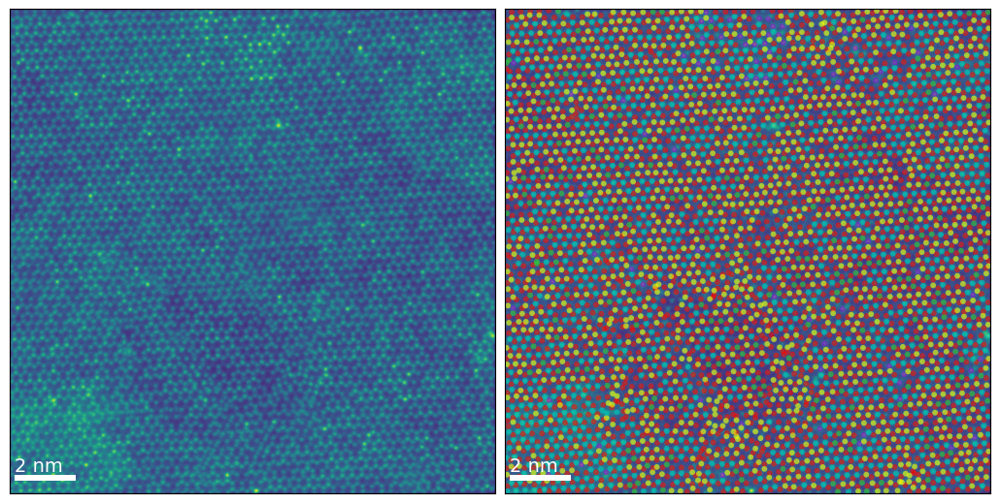

In [16]:
### Plot Atom-Labeled Image with Manually Set Thresholds
fig=plt.figure(figsize=(10.2,5))
ax=fig.add_axes([0,0,0.5,1],xticks=[],yticks=[])
ax.imshow(nIm)
ax.add_patch(Rectangle((10,985),2/cal,0.2/cal,fc="white"))
ax.text(10,985,'2 nm',ha='left',va='bottom',fontsize=14,color='white')
ax=fig.add_axes([0.5,0,0.5,1],xticks=[],yticks=[])
ax.imshow(nIm)
Acolors='r','DarkViolet'
Bcolors='LimeGreen','Yellow','c'
for A in enumerate(Asort):
    for a in A[1]:
        ax.add_patch(Circle((a[1],a[0]),alpha=0.6, radius=2*r,fc=Acolors[A[0]],lw=0.25))
for B in enumerate(Bsort):
    for b in B[1]:
        ax.add_patch(Circle((b[1],b[0]),alpha=0.6, radius=2*r,fc=Bcolors[B[0]],lw=0.25))
ax.add_patch(Rectangle((10,985),2/cal,0.2/cal,fc="white"))
ax.text(10,985,'2 nm',ha='left',va='bottom',fontsize=14,color='white')

plt.show()

## Load multiple images for training and validation


PROCESSING FILE: 3D Stack align1.dm3
  -> Loading: 3D Stack align1.dm3
  -> Found 3340 total atoms
  -> Sorting Sites (A/B)...
  -> Classifying Species...


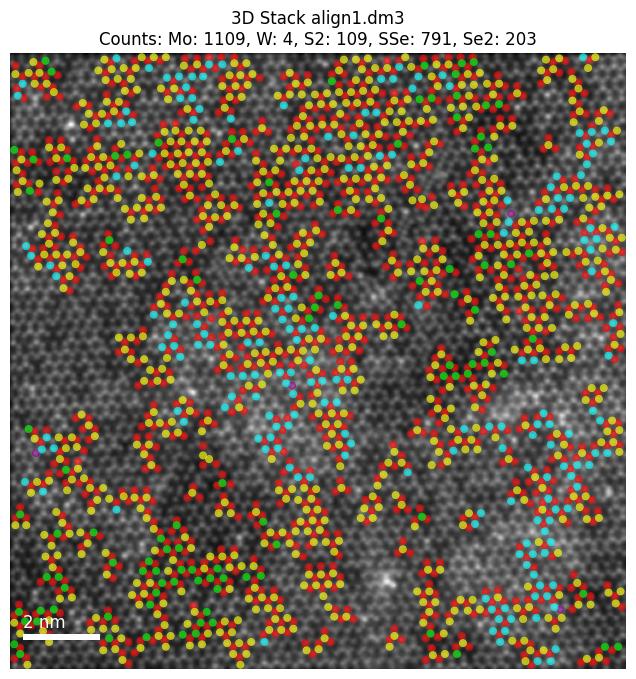


PROCESSING FILE: 3D Stack align2.dm3
  -> Loading: 3D Stack align2.dm3
  -> Found 5442 total atoms
  -> Sorting Sites (A/B)...
  -> Classifying Species...


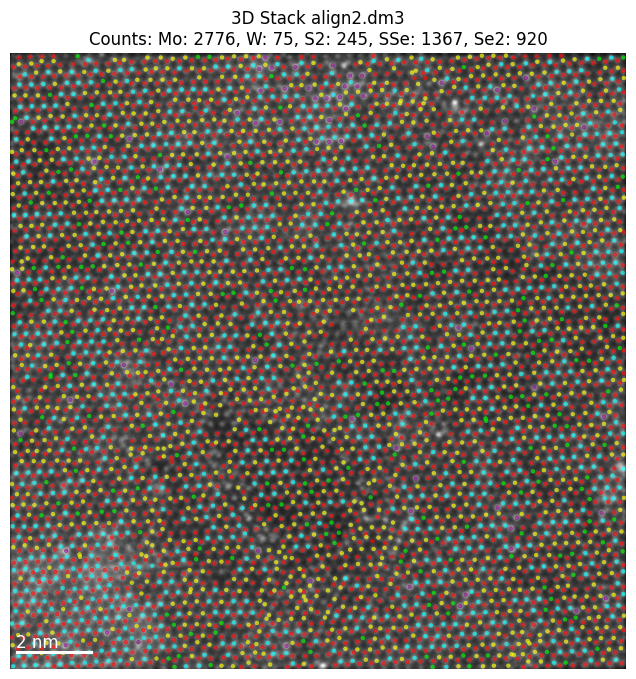


PROCESSING FILE: 3D Stack align3.dm3
  -> Loading: 3D Stack align3.dm3
  -> Found 5283 total atoms
  -> Sorting Sites (A/B)...
  -> Classifying Species...


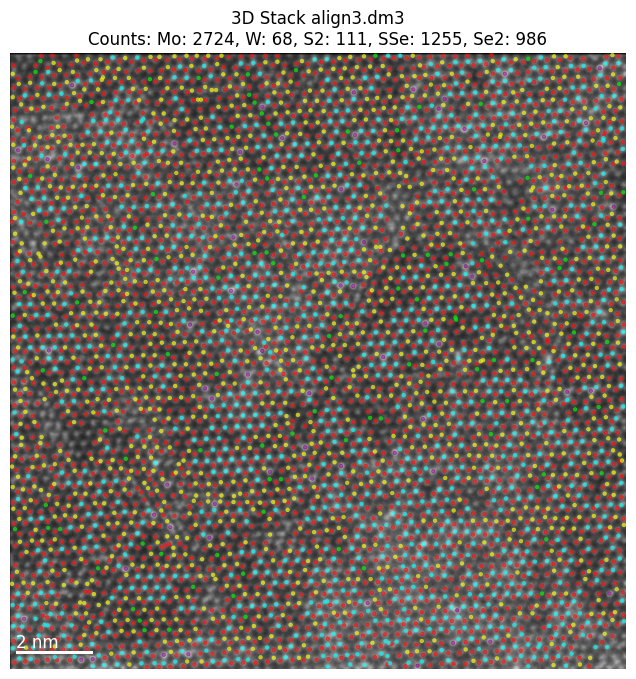


PROCESSING FILE: 3D Stack align4.dm3
  -> Loading: 3D Stack align4.dm3
  -> Found 1387 total atoms
  -> Sorting Sites (A/B)...
  -> Classifying Species...


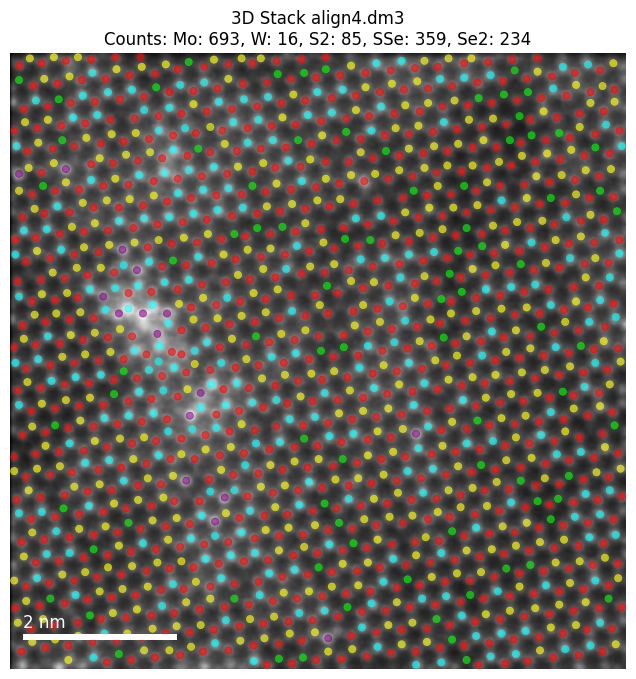


BATCH PROCESSING COMPLETE in 61.85 seconds
Created dataset with 4 entries.


In [19]:
import os
from scipy.spatial import cKDTree


# --- CONFIGURATION ---
BASE_PATH = '/content/drive/MyDrive/hackathon/QuaternaryAlloyMoWSSe/aligned/'
FILENAMES = [
    '3D Stack align1.dm3',
    '3D Stack align2.dm3',
    '3D Stack align3.dm3',
    '3D Stack align4.dm3'
]

# Standardize thresholds (Assuming normalized 0-1 intensities)
# Note: Deep learning models often handle intensity variations better,
# but for generating Ground Truth, consistent normalization is key.
THRESHOLDS_A = [0.71]       # Mo < 0.71 < W
THRESHOLDS_B = [0.36, 0.555] # S2 < 0.36 < SSe < 0.555 < Se2

# --- HELPER FUNCTIONS ---

def load_and_preprocess(filepath):
    """Loads dm3, sums stack, smooths, and normalizes."""
    print(f"  -> Loading: {os.path.basename(filepath)}")
    s = hs.load(filepath)
    cal = s.axes_manager[2].scale

    # Sum Z-stack if it's 3D, else just take data
    if s.data.ndim == 3:
        img = np.sum(s.data, axis=0)
    else:
        img = s.data

    # Gaussian Smooth
    img = ndimage.gaussian_filter(img, 1.0)

    # Normalize 0 to 1
    norm_img = (img - np.amin(img)) / np.ptp(img)

    return norm_img, cal

def find_atoms(img, min_dist=3, threshold=0.1):
    """Identifies atomic columns using peak finding."""
    # Using skimage's peak_local_max as a robust standard replacement
    coordinates = MaxPeak(img, min_distance=min_dist, threshold_rel=threshold, exclude_border=True)
    # skimage returns [row, col], your code expects [y, x] which is [row, col]
    return coordinates

def sort_sites_fast(allatoms, cal, T=0.25):
    """
    Optimized O(N log N) sorting of A vs B sites using KD-Tree.
    Replaces the slow O(N^2) loops.
    """
    print("  -> Sorting Sites (A/B)...")
    tree = cKDTree(allatoms)

    # Query all neighbors within distance T
    # dividing T by cal converts physical distance (nm) to pixel distance
    indices = tree.query_ball_point(allatoms, r=T/cal)

    ASite = set()
    BSite = set()
    Others = set()

    # Step 1: Geometry Check (Triangular vs inverted triangular)
    for i, neighbors in enumerate(indices):
        real_neighbors = [n for n in neighbors if n != i]

        if len(real_neighbors) == 3:
            # Calculate vectors
            vecs = (allatoms[i] - allatoms[real_neighbors]) * cal
            # Check vertical alignment (Y-axis is index 0 in numpy image coords)
            # y > 0 means neighbor is "above" in the matrix
            pm = np.sum(vecs[:, 0] > 0) - np.sum(vecs[:, 0] <= 0)

            if pm > 0: ASite.add(i)
            else: BSite.add(i)
        else:
            Others.add(i)

    # Step 2: Iterative cleanup (Majority voting)
    # If an 'Other' atom is surrounded by B-sites, it must be an A-site
    changed = True
    iteration = 0
    while changed and iteration < 50:
        changed = False
        iteration += 1
        current_others = list(Others)

        for o in current_others:
            n_idxs = [n for n in indices[o] if n != o]
            n_A = sum(1 for n in n_idxs if n in ASite)
            n_B = sum(1 for n in n_idxs if n in BSite)

            if n_B > n_A:
                ASite.add(o); Others.remove(o); changed = True
            elif n_A > n_B:
                BSite.add(o); Others.remove(o); changed = True

    return list(ASite), list(BSite)

def classify_species(img, allatoms, ASite, BSite, t_A, t_B):
    """
    Classifies specific species based on intensity thresholds.
    Returns a dictionary of coordinates for each species.
    """
    print("  -> Classifying Species...")

    # Extract intensities
    A_coords = allatoms[ASite]
    B_coords = allatoms[BSite]

    A_int = img[A_coords[:,0], A_coords[:,1]]
    B_int = img[B_coords[:,0], B_coords[:,1]]

    labels = {} # Store results here

    # Classify A Sites (Mo vs W)
    # Logic: Intensity < Threshold = Mo, else W
    mask_Mo = A_int < t_A[0]
    labels['Mo'] = A_coords[mask_Mo]
    labels['W'] = A_coords[~mask_Mo]

    # Classify B Sites (S2 vs SSe vs Se2)
    # Logic: S2 < t1 < SSe < t2 < Se2
    mask_S2 = B_int < t_B[0]
    mask_Se2 = B_int > t_B[1]
    mask_SSe = ~(mask_S2 | mask_Se2) # Everything in between

    labels['S2'] = B_coords[mask_S2]
    labels['SSe'] = B_coords[mask_SSe]
    labels['Se2'] = B_coords[mask_Se2]

    return labels

def visualize_final(img, labels, filename, cal):
    """Plots the final classification map."""
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(img, cmap='gray')

    # Define colors for classes
    color_map = {
        'Mo': 'red', 'W': 'purple',
        'S2': 'lime', 'SSe': 'yellow', 'Se2': 'cyan'
    }

    r = 3 # Radius for visual circles

    # Plot each species
    count_str = []
    for species, coords in labels.items():
        count_str.append(f"{species}: {len(coords)}")
        for (y, x) in coords:
            # Note: Matplotlib expects (x, y), numpy is (row, col) i.e. (y, x)
            ax.add_patch(Circle((x, y), radius=r, color=color_map[species], alpha=0.6, lw=0.5))

    # Scale bar (2 nm)
    # Width in pixels = 2 nm / scale
    sb_width = 2 / cal
    rect = Rectangle((10, img.shape[0]-30), sb_width, 5, fc='white')
    ax.add_patch(rect)
    ax.text(10, img.shape[0]-35, '2 nm', color='white', fontsize=12)

    plt.title(f"{filename}\nCounts: {', '.join(count_str)}")
    plt.axis('off')
    plt.show()

# --- MAIN EXECUTION LOOP ---

# Initialize dataset list to store training data
# Structure: [{'image': np_array, 'labels': {'Mo': [[y,x]...], ...}}, ...]
dataset = []

total_start = time.time()

for fname in FILENAMES:
    print(f"\nPROCESSING FILE: {fname}")
    full_path = os.path.join(BASE_PATH, fname)

    # 1. Load
    nIm, cal = load_and_preprocess(full_path)

    # 2. Find Atoms
    allatoms = find_atoms(nIm, min_dist=3, threshold=0.1)
    print(f"  -> Found {len(allatoms)} total atoms")

    # 3. Sort A/B Sites (Optimized)
    ASite_idxs, BSite_idxs = sort_sites_fast(allatoms, cal)

    # 4. Classify Species
    species_labels = classify_species(nIm, allatoms, ASite_idxs, BSite_idxs, THRESHOLDS_A, THRESHOLDS_B)

    # 5. Add to Dataset
    data_entry = {
        'filename': fname,
        'image': nIm,
        'scale': cal,
        'annotations': species_labels
    }
    dataset.append(data_entry)

    # 6. Visualize
    visualize_final(nIm, species_labels, fname, cal)

print("\n" + "="*40)
print(f"BATCH PROCESSING COMPLETE in {time.time()-total_start:.2f} seconds")
print(f"Created dataset with {len(dataset)} entries.")
print("="*40)

# Example: Accessing data for Deep Learning
# X_train = np.array([d['image'] for d in dataset])
# print("Training Data Shape:", X_train.shape)

In [28]:
# Example: Accessing data for Deep Learning
for d in dataset:
    print(d['image'].shape)

print('2 of the images are 512x512 and 2 are 1024x1024')

(512, 512)
(1024, 1024)
(1024, 1024)
(512, 512)


In [29]:
import numpy as np
import copy

def split_image_and_labels(entry, crop_size=512):
    """
    Splits a 1024x1024 entry into four 512x512 entries,
    adjusting atom coordinates automatically.
    """
    img = entry['image']
    h, w = img.shape

    # If already the right size, return as a single-item list
    if h == crop_size and w == crop_size:
        return [entry]

    # Define the 4 quadrants (y_start, x_start)
    # Top-Left, Top-Right, Bottom-Left, Bottom-Right
    offsets = [
        (0, 0),
        (0, crop_size),
        (crop_size, 0),
        (crop_size, crop_size)
    ]

    new_entries = []

    for i, (oy, ox) in enumerate(offsets):
        # 1. Crop the Image
        # Slice: from oy to oy+512, from ox to ox+512
        crop_img = img[oy : oy+crop_size, ox : ox+crop_size]

        # 2. Adjust Annotations
        new_annotations = {}

        for species, coords in entry['annotations'].items():
            if len(coords) == 0:
                new_annotations[species] = np.array([])
                continue

            # Convert to numpy for easy math
            coords = np.array(coords)

            # Shift coordinates: New = Old - Offset
            # coords is [y, x], so we subtract [oy, ox]
            shifted_coords = coords - np.array([oy, ox])

            # Filter: Keep atoms that are actually inside this crop
            # (0 <= y < 512) AND (0 <= x < 512)
            mask = (
                (shifted_coords[:, 0] >= 0) &
                (shifted_coords[:, 0] < crop_size) &
                (shifted_coords[:, 1] >= 0) &
                (shifted_coords[:, 1] < crop_size)
            )

            new_annotations[species] = shifted_coords[mask]

        # 3. Create new dataset entry
        new_entry = {
            'filename': f"{entry['filename']}_crop_{i+1}",
            'image': crop_img,
            'scale': entry['scale'],
            'annotations': new_annotations
        }
        new_entries.append(new_entry)

    return new_entries

# --- EXECUTION ---

final_dataset = []

print(f"Original Dataset Size: {len(dataset)}")

for data_entry in dataset:
    # Run the split function on each existing entry
    splits = split_image_and_labels(data_entry, crop_size=512)
    final_dataset.extend(splits)

print(f"New Dataset Size: {len(final_dataset)}")

# --- VERIFICATION ---
# Let's check the shapes to be sure
shapes = [d['image'].shape for d in final_dataset]
print(f"Unique image shapes in final dataset: {set(shapes)}")
# Should print: {(512, 512)}

Original Dataset Size: 4
New Dataset Size: 10
Unique image shapes in final dataset: {(512, 512)}


In [31]:
# Example: Accessing data for Deep Learning
X_train = np.array([d['image'] for d in final_dataset])
print("Training Data Shape:", X_train.shape)

Training Data Shape: (10, 512, 512)


Generating Segmentation Masks...
Input Shape: (10, 1, 512, 512)
Mask Shape: (10, 512, 512)
Starting Training...
Epoch 1/300 ... Training loss: 2.0877 ... Test loss: 1.8667 ... Train Accuracy: 0.0708 ... Test Accuracy: 0.0768 ... GPU memory usage: 2102/15360
Epoch 100/300 ... Training loss: 0.4746 ... Test loss: 0.471 ... Train Accuracy: 0.6495 ... Test Accuracy: 0.6264 ... GPU memory usage: 2102/15360
Epoch 200/300 ... Training loss: 0.7688 ... Test loss: 0.4548 ... Train Accuracy: 0.5659 ... Test Accuracy: 0.7224 ... GPU memory usage: 2102/15360
Epoch 300/300 ... Training loss: 0.104 ... Test loss: 0.3338 ... Train Accuracy: 0.9173 ... Test Accuracy: 0.7507 ... GPU memory usage: 2102/15360
Model (final state) evaluation loss: 0.3338
Model (final state) accuracy: 0.7507
Performing stochastic weight averaging...
Model (final state) evaluation loss: 0.3219
Model (final state) accuracy: 0.746
Plotting training history


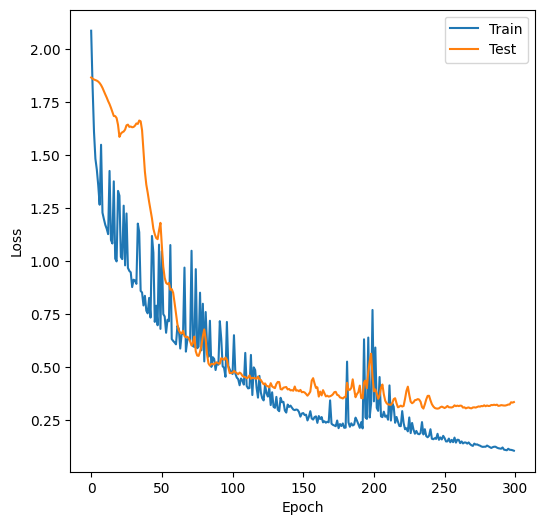

Predicting on Test Data...
Batch 2/2
2 images were decoded in approximately 0.1932 seconds


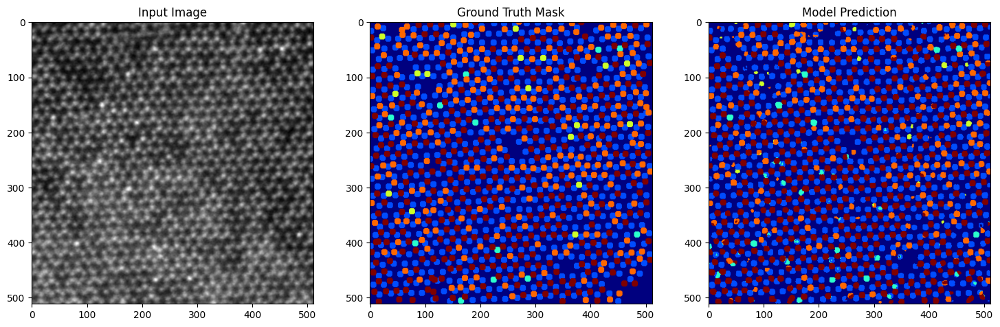

In [35]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.draw import disk
from sklearn.model_selection import train_test_split
import atomai as aoi

# --- 1. DEFINE CLASS MAPPING ---
# 0 is always Background in semantic segmentation
class_map = {
    'Mo': 1,
    'W': 2,
    'S2': 3,
    'SSe': 4,
    'Se2': 5
}
nb_classes = len(class_map) + 1  # 5 atoms + 1 background = 6 classes

# --- 2. DATA TRANSFORMATION FUNCTION (Corrected for PyTorch Targets) ---
def create_segmentation_masks(dataset, height, width, radius=5):
    n_samples = len(dataset)

    # X (Images): 4D Shape (N, 1, H, W) <--- KEEPS CHANNEL DIM
    X = np.zeros((n_samples, 1, height, width))

    # Y (Labels): 3D Shape (N, H, W)    <--- REMOVES CHANNEL DIM
    Y = np.zeros((n_samples, height, width))

    for i, entry in enumerate(dataset):
        # Fill Image Array
        X[i, 0, :, :] = entry['image']

        # Fill Mask Array
        mask = np.zeros((height, width))
        for species, coords in entry['annotations'].items():
            class_idx = class_map[species]

            for coord in coords:
                rr, cc = disk((coord[0], coord[1]), radius, shape=(height, width))
                mask[rr, cc] = class_idx

        # Assign directly to the 3D array (no '0' index for channel)
        Y[i, :, :] = mask

    return X, Y

# --- 3. PREPARE DATA ---
print("Generating Segmentation Masks...")
X_all, Y_all = create_segmentation_masks(final_dataset, 512, 512, radius=6)

print(f"Input Shape: {X_all.shape}") # Should be (10, 1, 512, 512)
print(f"Mask Shape: {Y_all.shape}")  # Should be (10, 512, 512) <-- No '1'

# Split into Train and Test
X_train, X_test, Y_train, Y_test = train_test_split(X_all, Y_all, test_size=0.2, random_state=42)

# --- 4. TRAIN THE MODEL ---
# We use 6 classes (0=Background, 1-5=Atoms)
model = aoi.models.Segmentor(nb_classes=nb_classes)

print("Starting Training...")
model.fit(
    X_train, Y_train,
    X_test, Y_test,
    training_cycles=300,
    batch_size=2,        # Small batch size since we only have 8 training images
    compute_accuracy=True,
    swa=True             # Stochastic Weight Averaging for better generalization
)

# --- 5. VALIDATE & VISUALIZE ---
print("Predicting on Test Data...")
# Predict returns:
# nn_output: The probability map (N, H, W, Classes)
# coordinates: The extracted atomic coordinates from the map
nn_output, coordinates = model.predict(X_test)

# Visualize the first test image result
idx = 0
input_img = X_test[idx].squeeze()
true_mask = Y_test[idx].squeeze()
pred_mask = np.argmax(nn_output[idx], axis=-1) # Convert prob map to integer mask

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

ax1.imshow(input_img, cmap='gray')
ax1.set_title("Input Image")

ax2.imshow(true_mask, cmap='jet', vmin=0, vmax=5)
ax2.set_title("Ground Truth Mask")

ax3.imshow(pred_mask, cmap='jet', vmin=0, vmax=5)
ax3.set_title("Model Prediction")

plt.show()

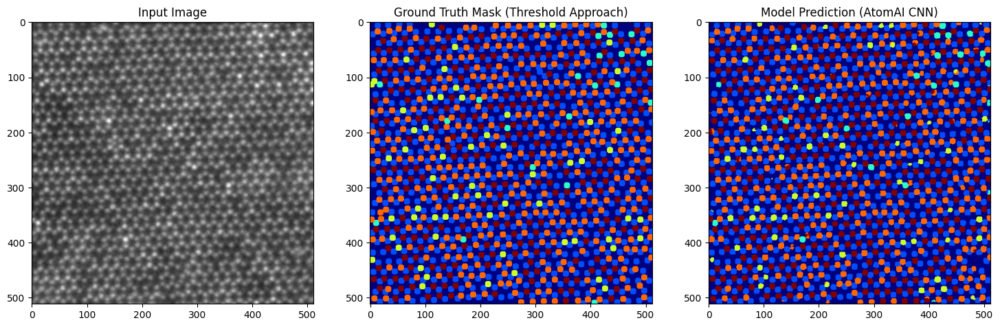

In [37]:
# Visualize the second test image result
idx = 1
input_img = X_test[idx].squeeze()
true_mask = Y_test[idx].squeeze()
pred_mask = np.argmax(nn_output[idx], axis=-1) # Convert prob map to integer mask

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

ax1.imshow(input_img, cmap='gray')
ax1.set_title("Input Image")

ax2.imshow(true_mask, cmap='jet', vmin=0, vmax=5)
ax2.set_title("Ground Truth Mask (Threshold Approach)")

ax3.imshow(pred_mask, cmap='jet', vmin=0, vmax=5)
ax3.set_title("Model Prediction (AtomAI CNN)")

plt.show()

In [38]:
model.save_model('/content/drive/MyDrive/hackathon/QuaternaryAlloyMoWSSe/haadf_model_01')

## Semantic segmentation

Download training/test data:

In [11]:
download_link1 = 'https://drive.google.com/uc?id=1-4-IQ71m--OelQb1891GnbG1Ako1-DKh'
download_link2 = 'https://drive.google.com/uc?id=18JK9GcMPMWHmHtwArujVQRLr6N4VIM_j'
!gdown -q $download_link1 -O 'training_data.npy'
!gdown -q $download_link2 -O 'validation_data.npy'

# Load train/test data (this is a simple dataset generated just from a single image)
dataset = np.load('training_data.npy')
images = dataset['X_train']
labels = dataset['y_train']
images_test = dataset['X_test']
labels_test = dataset['y_test']
# Load validation data (data from different experiment)
expdata = np.load("validation_data.npy")

In [12]:
print(images.shape, labels.shape)
print(images_test.shape, labels_test.shape)

(1656, 1, 256, 256) (1656, 256, 256)
(414, 1, 256, 256) (414, 256, 256)


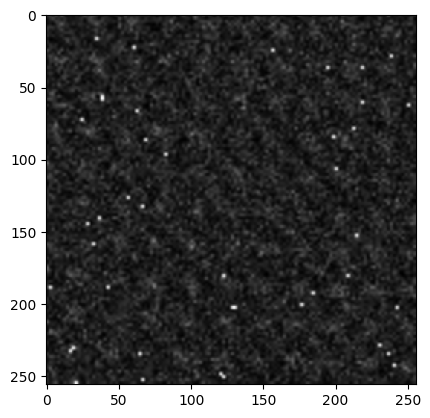

In [13]:
plt.imshow(images[0,0,:,:], cmap='gray')
plt.show()

The training data was generated from a single labeled experimental STEM image of Sm-doped BFO containing ~20,000 atomic unit cells (see arXiv:2002.04245 and the associated notebook). The "mother image" was ~3000 px x 3000 px. We randomly cropped about 2000 image-masks pairs of 256 x 256 resolution and then applied different image "distortions" (noise, blurring, zoom, etc.) to each cropped image, treating two atomic sublattices as two different classes.

The training/test images and masks represent 4 separate numpy arrays with the dimensions (n_images, n_channels=1, image_height, image_width) for training/test images, and (n_images, image_height, image_width) for the associated masks (aka ground truth). The reason that our images have 4 dimensions, while our labels have only 3 dimensions is because of how the cross-entropy loss is calculated in PyTorch (see [here](https://pytorch.org/docs/stable/nn.html#nllloss)). Briefly, if you have multiple channels corresponding to different classes in your labeled data, you'll need to map your target classes to tensor indices. Here, we already did this for our training and test data during the preparation stage and so everything is ready for training.

Let's plot some of the training data:

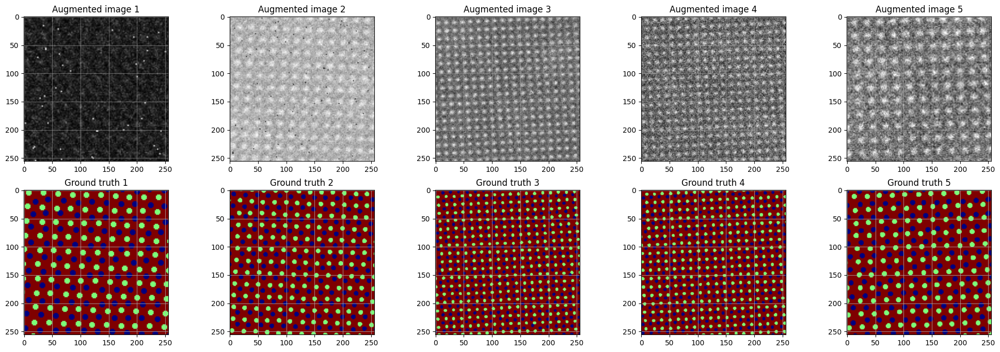

In [14]:
n = 5 # number of images to plot

n = n + 1
fig = plt.figure( figsize=(30, 8))
for i in range(1, n):
    ax = fig.add_subplot(2, n, i)
    ax.imshow(images[i-1,0,:,:], cmap='gray')
    ax.set_title('Augmented image ' + str(i))
    ax.grid(alpha = 0.5)
    ax = fig.add_subplot(2, n, i+n)
    ax.imshow(labels[i-1], interpolation='Gaussian', cmap='jet')
    ax.set_title('Ground truth ' + str(i))
    ax.grid(alpha=0.75)

The neural network will be trained to take the images in the top row (see plot above) as the input and to output clean images of circular-shaped "blobs" on a uniform background in the bottom row, from which one can identify the xy centers of atoms.

We are going to use a [UNet](https://en.wikipedia.org/wiki/U-Net)-like neural network for semantic segmentation. In the semantic segmentation tasks we aim at categorizing every pixel in the image. This is different form a regular image-level classification tasks, where we categorize the image as whole (e.g. this image has a cat/dog, etc.). Here's a nice illustration from this [free book](https://pytorch.org/assets/deep-learning/Deep-Learning-with-PyTorch.pdf):

<img src="https://drive.google.com/uc?export=view&id=18N4x3P0whH91OcpBOOkDprgWVo-36i34" width=800 px><br><br>

Initialize a nodel for semantic segmentation:

In [15]:
model = aoi.models.Segmentor(nb_classes=3)

We can also "print" the neural network:

In [16]:
print(model.net)

Unet(
  (c1): ConvBlock(
    (block): Sequential(
      (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (c2): ConvBlock(
    (block): Sequential(
      (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): LeakyReLU(negative_slope=0.01)
      (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (c3): ConvBlock(
    (block): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

Train the initialized model:

(Here the accuracy is calculated as [Intersection over Union](https://en.wikipedia.org/wiki/Jaccard_index) (IoU) score, which is the area of overlap between the predicted segmentation and the ground truth divided by the area of union between them)

Epoch 1/300 ... Training loss: 1.2846 ... Test loss: 1.2103 ... Train Accuracy: 0.0901 ... Test Accuracy: 0.0405 ... GPU memory usage: 6030/15360
Epoch 100/300 ... Training loss: 0.462 ... Test loss: 0.3924 ... Train Accuracy: 0.6654 ... Test Accuracy: 0.6677 ... GPU memory usage: 6030/15360
Epoch 200/300 ... Training loss: 0.2686 ... Test loss: 0.2633 ... Train Accuracy: 0.7256 ... Test Accuracy: 0.7322 ... GPU memory usage: 6030/15360
Epoch 300/300 ... Training loss: 0.2355 ... Test loss: 0.2167 ... Train Accuracy: 0.7388 ... Test Accuracy: 0.7477 ... GPU memory usage: 6030/15360
Model (final state) evaluation loss: 0.2365
Model (final state) accuracy: 0.7222
Performing stochastic weight averaging...
Model (final state) evaluation loss: 0.2305
Model (final state) accuracy: 0.7345
Plotting training history


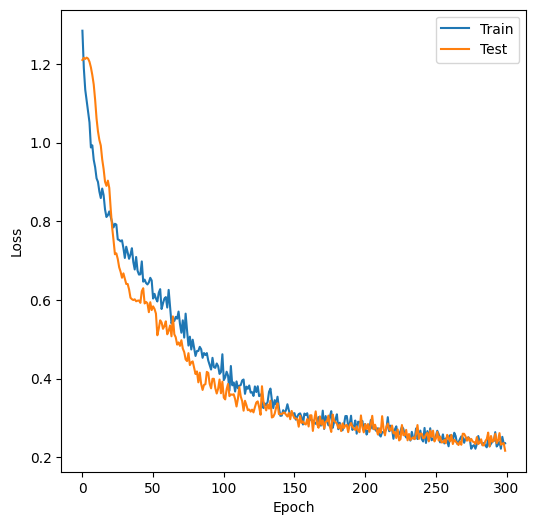

In [17]:
model.fit(images, labels, images_test, labels_test, # training data
          training_cycles=300, compute_accuracy=True, swa=True # training parameters
)

Now let's make a prediction on the image from a different experiment ( the data is from our paper in *Applied Physics Letters 115, 052902 (2019)* ). Notice that the raw output is a set of semantically segmented blobs (corresponding to different atoms) on a uniform background. We then simply find their centers of the mass, which correspond to the atomic centers (if a network was properly trained).

np.float32(1.0)

In [27]:
nn_output, coordinates = model.predict(nIm)

Batch 1/1
1 image was decoded in approximately 0.0573 seconds


Plot raw prediction:

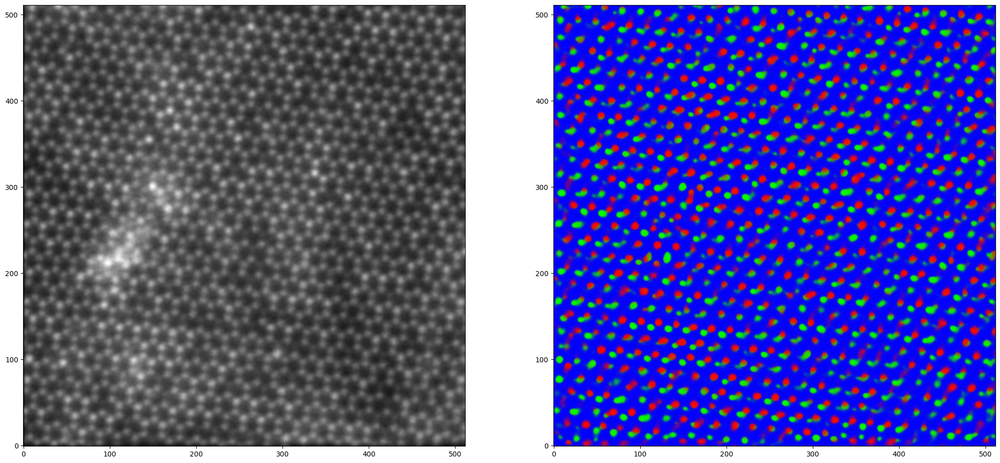

In [29]:
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 12))
ax1.imshow(nIm, cmap='gray', origin="lower")
ax2.imshow(nn_output.squeeze(), origin="lower")

Plot atomic coordinates:

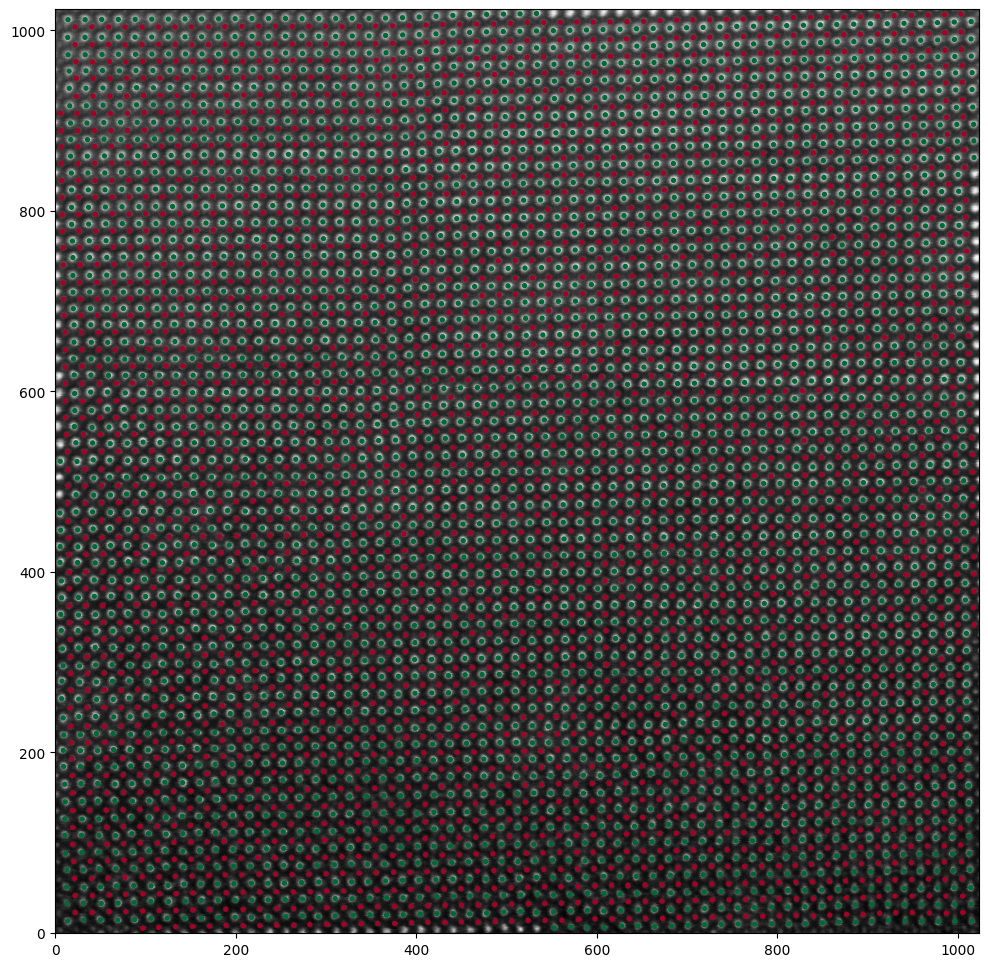

In [ ]:
aoi.utils.plot_coord(expdata, coordinates[0], fsize=12)

Looks like our model performed quite well on the previously unseen data! There is no ground truth for the experimental data, so evaluating accuracy is somewhat tricky, but we can sometimes compare our results with the results of other methods.

Notice that here we analyzed image with resolution of 1024x1024 even though our network was trained only using 256x256 images. That's the beauty of fully convolutional neural networks (i.e. network without full-connected, dense layers) - it is not sensitive to the size of input image as long as it can be divided by $2^{n}$ where n is a number of max-pooling layers in the network. That said, there is always some optimal pixel-to-angstrom ratio (or, roughly, number of pixels per atom/defect) at which a network will generate the best results. It might be a good idea to determine such a ratio and (if possible) make adjustments to the resolution of experimental images.

Finally, please keep in mind that the model was trained onnly on a single image, so it may not be very robust or generalize well enough. However, the procedure for training on the larger and more diverse training set is exactly the same!

## Multivariate Analysis

Once we have all atomic coordiantes and "cleaned" images we can perform various forms of analysis on local image descriptors. In the remainder of this notebook, we are going to use AtomAI's *stat* module to get a stack of subimages around one of the atom types and perform different types of statistical analysis on them that would reveal the domain structure and the associated "principal" distortions in an unsupervised manner:

Start by get local descriptors, which are subimages centered on one of the sublattices:

In [ ]:
imstack = aoi.stat.imlocal(nn_output, coordinates, window_size=32, coord_class=1)

Compute PCA scree plot to estimate the number of components/sources for the multivariate analysis below:

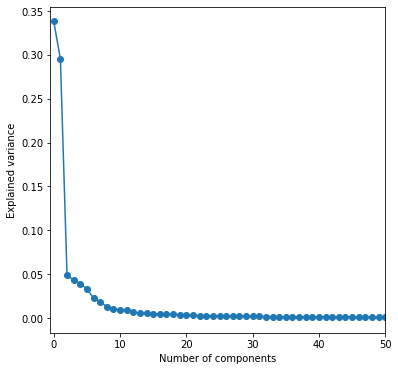

In [ ]:
imstack.pca_scree_plot(plot_results=True);

Do PCA analysis and plot results:

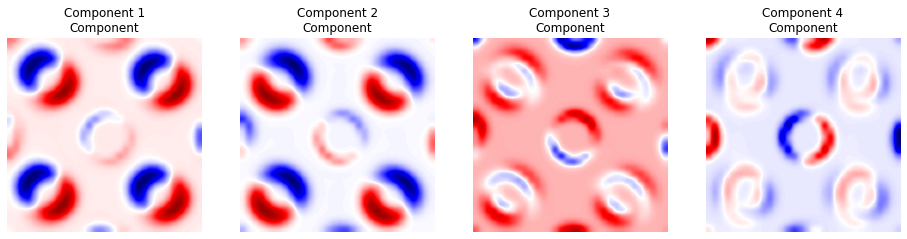

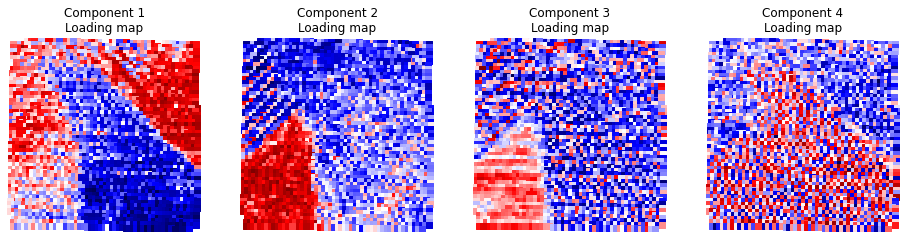

In [ ]:
pca_results = imstack.imblock_pca(4, plot_results=True)

Do ICA analysis and plot results:

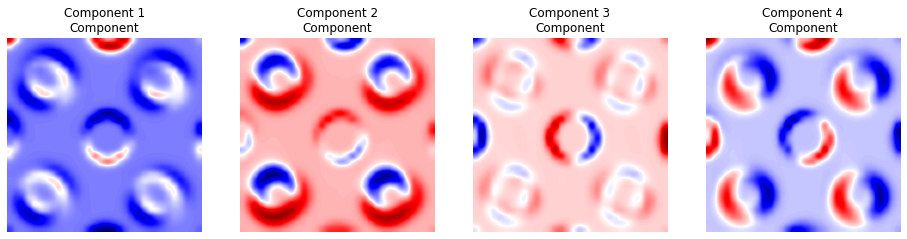

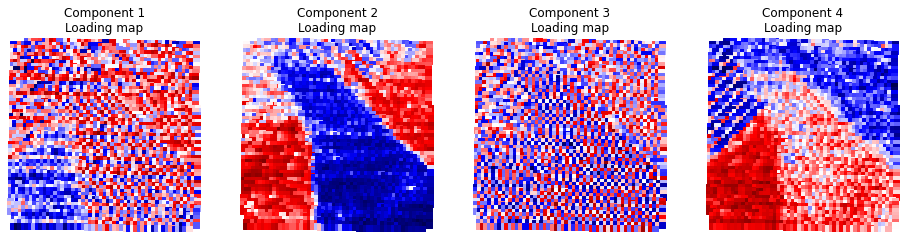

In [ ]:
ica_results = imstack.imblock_ica(4, plot_results=True)

Do NMF analysis and plot results:

/usr/local/lib/python3.7/dist-packages/sklearn/decomposition/_nmf.py:294: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/decomposition/_nmf.py:1641: ConvergenceWarning: Maximum number of iterations 1000 reached. Increase it to improve convergence.
  ConvergenceWarning,


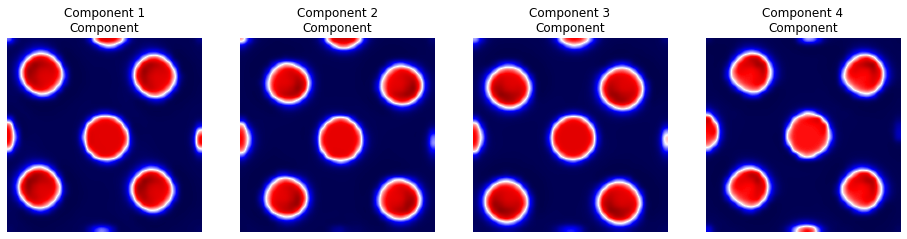

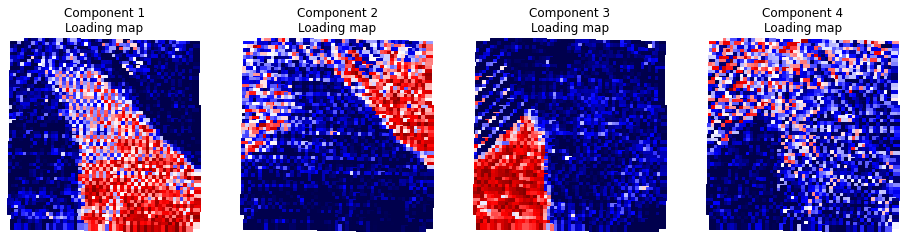

In [ ]:
nmf_results = imstack.imblock_nmf(4, plot_results=True)